Import package

In [135]:
# import required module
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'
import numpy as np
import matplotlib.pyplot as plt
import cv2  #import Image read package
import albumentations as albu  # import required packages for data augmentation
from icecream import ic

# import modules for data extraction, augmentation, and preprocessing
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset

# For Learning Curves
import torch
import torchvision
from torch.utils.tensorboard import SummaryWriter
from torchvision import datasets, transforms

In [136]:
# Set directory of files
DATA_DIR = r'C:\Users\user\Desktop\Psoriasis\Psoriasis_Dataset\Psoriasis_Train'

xTrainDir = os.path.join(DATA_DIR,'Psoriasis_Train_Image') #set Train Images dir
# bodyTrainDir = os.path.join(DATA_DIR,'Psoriasis_Train_Label_Body')  #set Train body Label Images dir
psoriasisTrainDir = os.path.join(DATA_DIR,'Psoriasis_Train_Label_Plaque')

xValidDir = os.path.join(DATA_DIR,'Psoriasis_Valid_Image')   #set Validation Images dir
# bodyValidDir = os.path.join(DATA_DIR,'Psoriasis_Valid_Label_Body')   #set Validation body Label Images dir 
psoriasisValidDir = os.path.join(DATA_DIR,'Psoriasis_Valid_Label_Plaque')

xTestDir = os.path.join(DATA_DIR,'Psoriasis_Valid_Image')  #set Test Images dir
# bodyTestDir = os.path.join(DATA_DIR,'Psoriasis_Valid_Label_Body')  #set Test body Label Images dir
psoriasisTestDir = os.path.join(DATA_DIR,'Psoriasis_Valid_Label_Plaque')



In [137]:
# Helper function for data visualization

def visualize(**images):
  n = len(images)
  plt.figure(figsize = (16,5)) 
  for i, (name, image) in enumerate(images.items()):
    plt.subplot(1, n, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(' '.join(name.split('_')).title())
    plt.imshow(image)
  plt.show()

In [138]:
#  Define class for data extraction, augmentation, and preprocessing

class Dataset(BaseDataset):

  CLASSES = ['body','background'] #Classes of Image mask
  # CLASSES = ['sky', 'building', 'pole', 'road', 'pavement', 
  #            'tree', 'signsymbol', 'fence', 'car',
  #            'pedestrian', 'bicycclist', 'unlabelled']

  def __init__(
      self,
      imagesDir,
      annotationDir,
      classes = None,
      augmentation = None,
      preprocessing = None,
  ):
    self.ids = os.listdir(imagesDir)   
    self.imagesFps = [os.path.join(imagesDir,imageID) for imageID in self.ids]  
    self.annotationsFps = [os.path.join(annotationDir,imageID) for imageID in self.ids]
    self.classValues = [self.CLASSES.index(cls.lower()) for cls in classes]
    self.augmentation = augmentation
    self.preprocessing = preprocessing

  def __getitem__(self,i):

    # read data
    image  = cv2.imread(self.imagesFps[i])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = np.stack(image)
    annotation = cv2.imread(self.annotationsFps[i],0)  

    #extract certain classes from annotation (Like- Body)
    annotations = [(annotation == v) for v in self.classValues]
    annotation = np.stack(annotations, axis = -1).astype('float')
    annotation = np.logical_not(annotation)
    annotation = np.array(annotation, dtype='int16')

    # apply augmentations
    if self.augmentation:
      sample = self.augmentation(image=image, mask=annotation)
      image, annotation = sample['image'], sample['mask']

    # Apply preprocessing
    if self.preprocessing:
      sample = self.preprocessing(image=image, mask=annotation)
      image, annotation = sample['image'], sample['mask']
    
    return image,annotation

  def __len__(self):
    return len(self.ids)


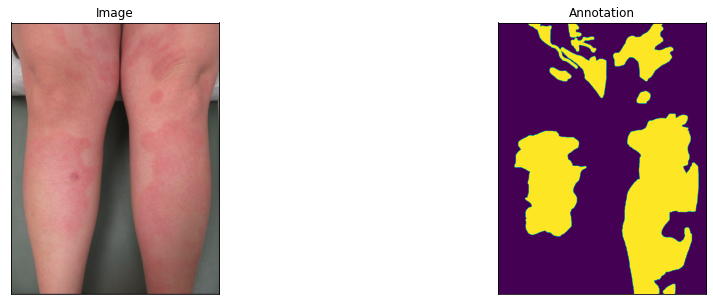

In [139]:
# Let's look at data we have

dataset = Dataset(xTrainDir,psoriasisTrainDir,classes=['Body']) # Check specific class to see the Image annotation

image, annotation = dataset[3] # get a sample

visualize(
    image = image,
    annotation = annotation.squeeze(),
)

In [153]:
# define function for data augmentation
# Comment out more data augmentation due to over image processing in test dataset.
def getTrainingAugmentation():
  trainTransform = [
#                     albu.HorizontalFlip(p=0.5), # horizontal flip 50%

#                     albu.ShiftScaleRotate(scale_limit = 0.5, rotate_limit = 0, shift_limit = 0.1, p = 1, border_mode = cv2.BORDER_REPLICATE),

                    albu.PadIfNeeded(min_height=640, min_width=960, always_apply=True, border_mode=0),
                    albu.RandomCrop(height=640, width=960, always_apply=False),

#                     albu.IAAAdditiveGaussianNoise(p=0.2),
#                     albu.IAAPerspective(p=0.5),
                                        
#                     albu.OneOf(
#                         [
#                          albu.CLAHE(p=1),
#                          albu.RandomBrightness(p=1),
#                          albu.RandomGamma(p=1),
#                         ],
#                         p=0.9,
#                     ),

#                     albu.OneOf(
#                         [
#                          albu.IAASharpen(p=1),
#                          albu.Blur(blur_limit=3, p=1),
#                          albu.MotionBlur(blur_limit=3, p=1),
#                         ],
#                         p=0.9,
#                     ),

#                     albu.OneOf(
#                         [
#                          albu.RandomContrast(p=1),
#                          albu.HueSaturationValue(p=1),
#                         ],
#                         p=0.9,
#                     ),                    
  ]
  return albu.Compose(trainTransform)

def getValidationAugmentation():
  # add padding to make image shape divisible by 32
  testTransform = [
                   albu.PadIfNeeded(640,960) # change value 384,480 to 320,320
  ]
  return albu.Compose(testTransform)

def toTensor(x,**kwargs):
  return x.transpose(2, 0, 1).astype('float32')

def getPreprocessing(preprocessingFcn):
  # construct prprocessing transform

  _transform = [
                albu.Lambda(image = preprocessingFcn),
                albu.Lambda(image = toTensor, mask= toTensor),
  ]
  return albu.Compose(_transform)

0


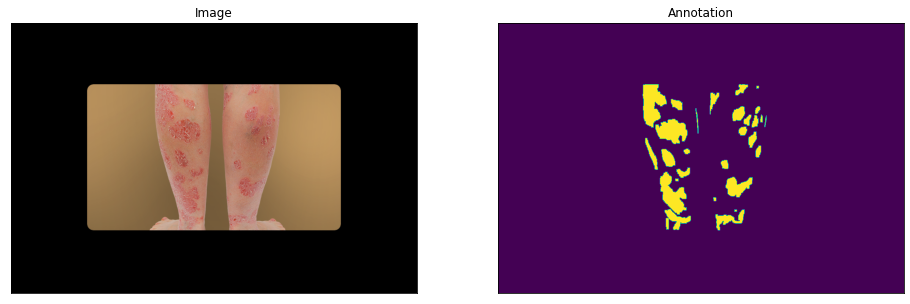

1


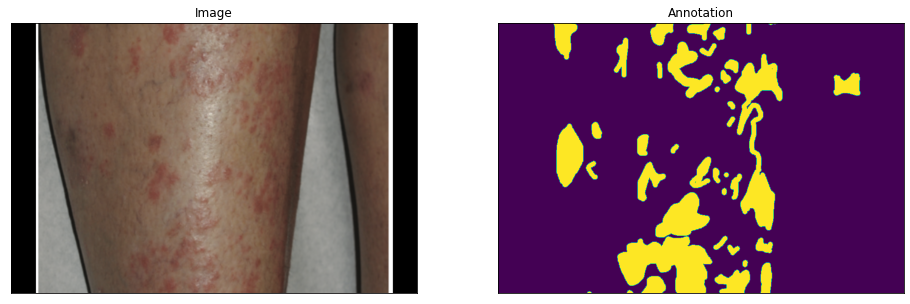

2


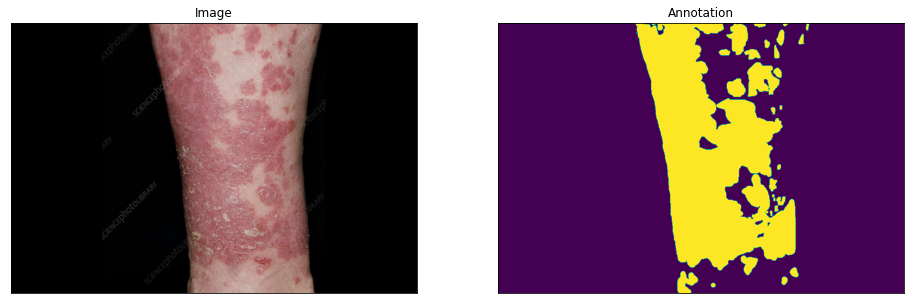

3


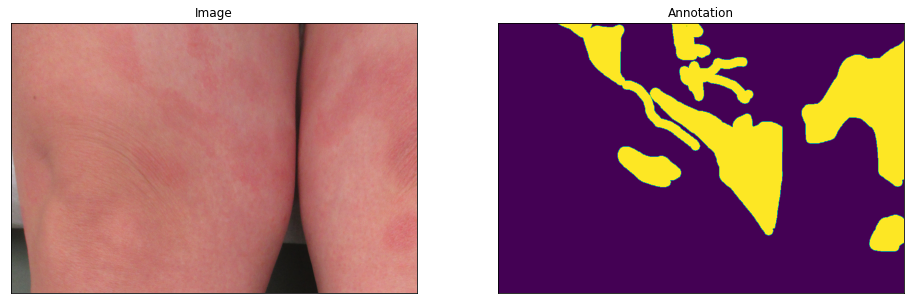

4


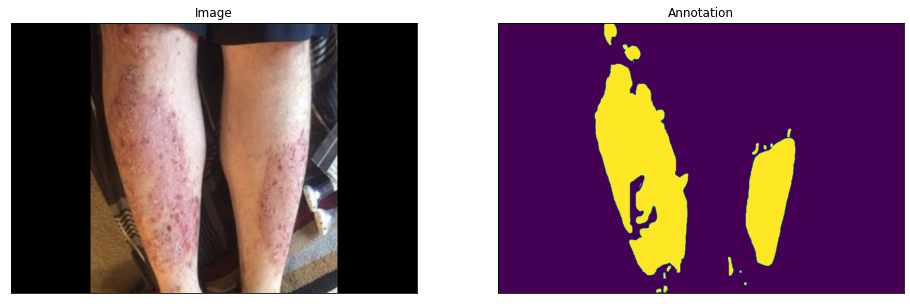

5


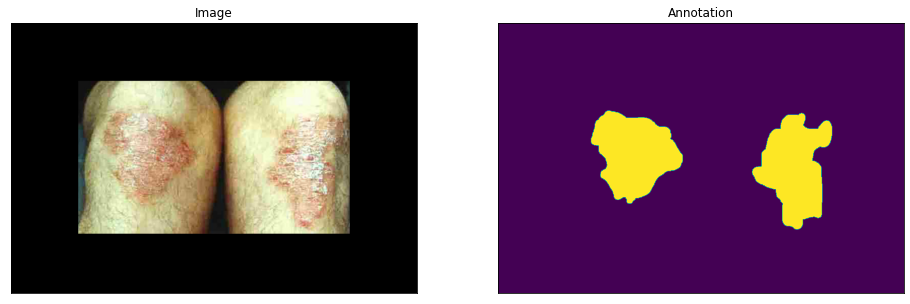

6


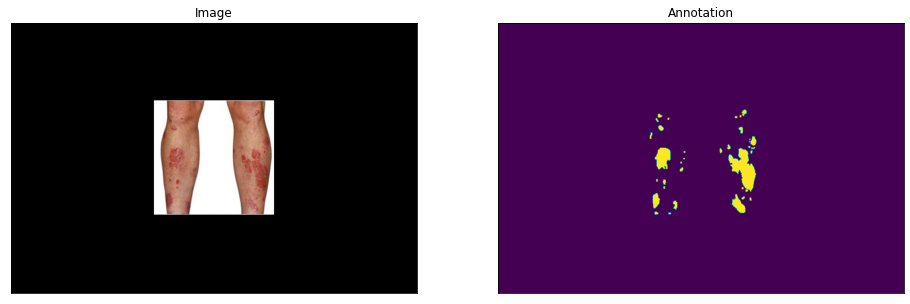

7


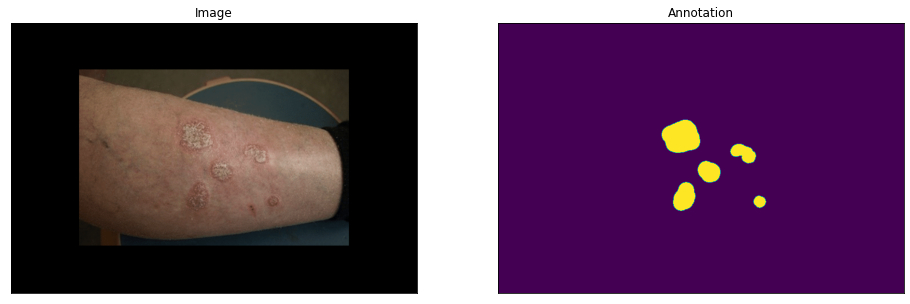

8


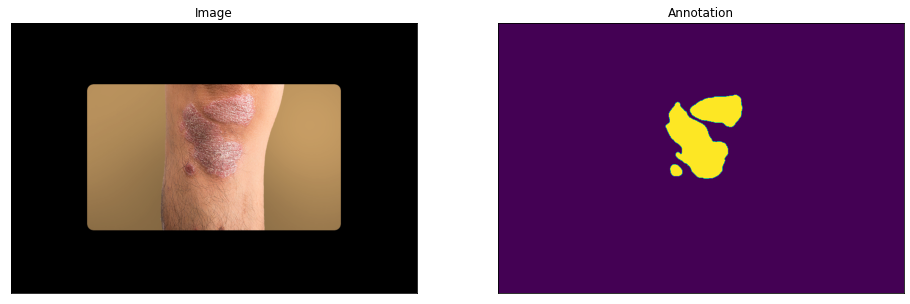

9


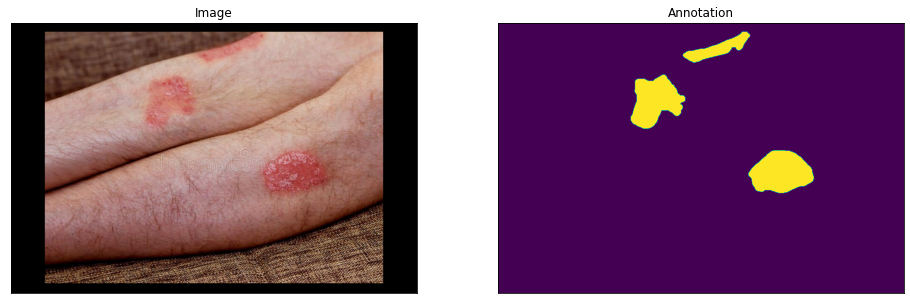

10


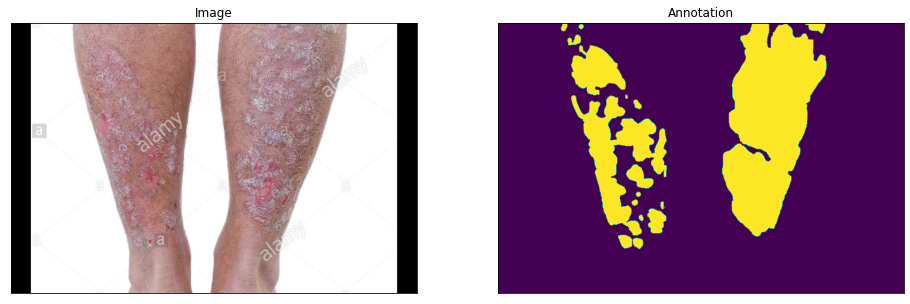

11


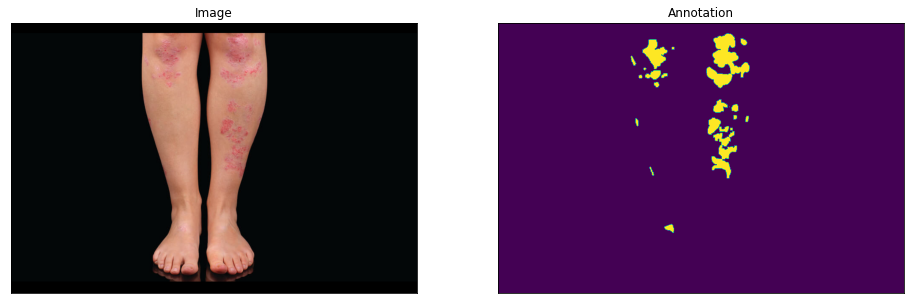

12


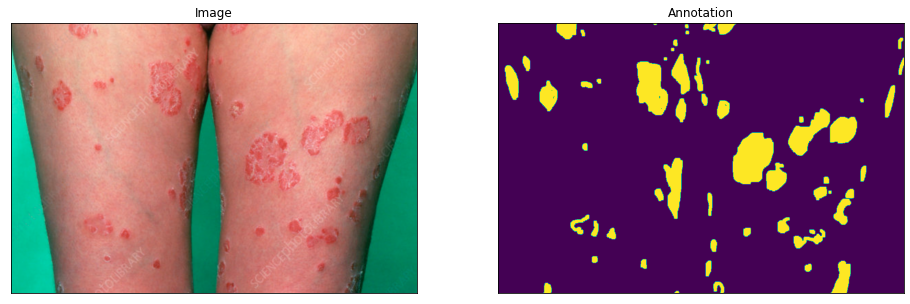

13


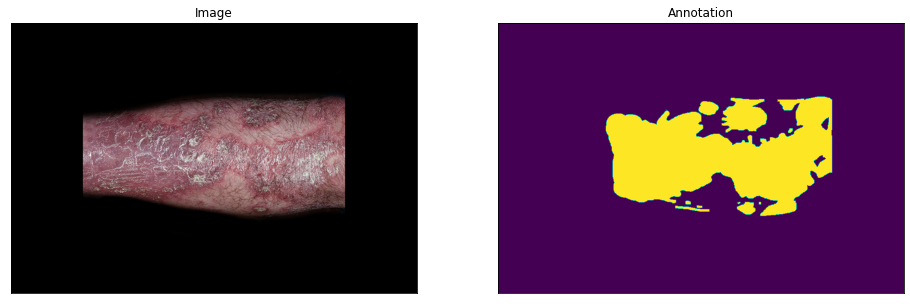

14


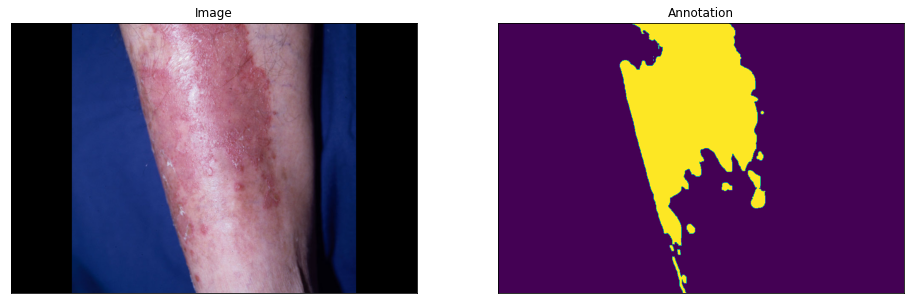

15


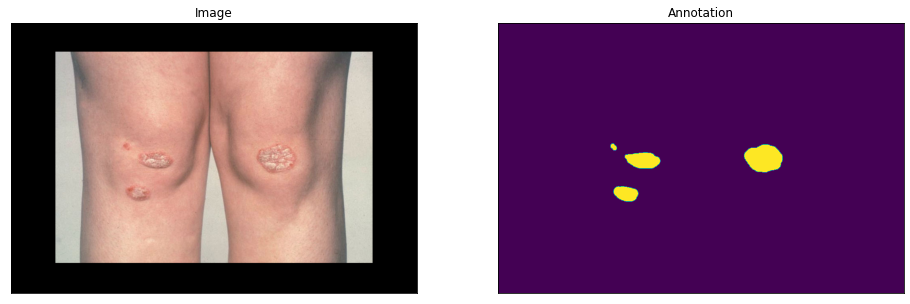

16


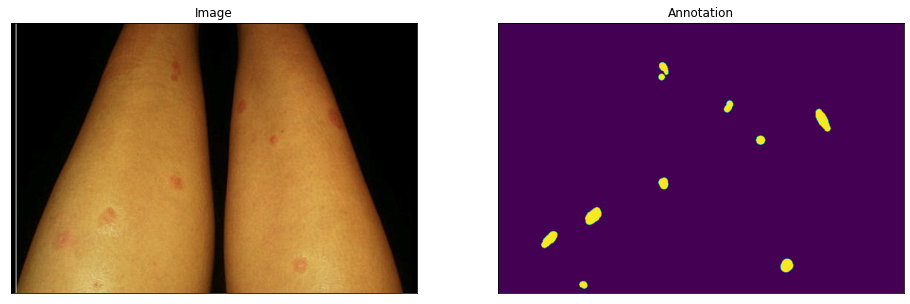

17


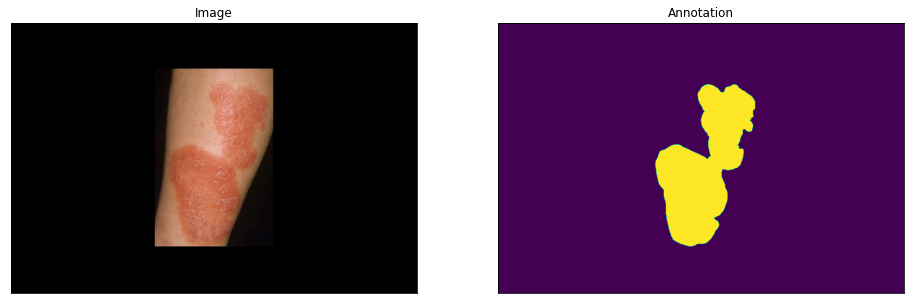

18


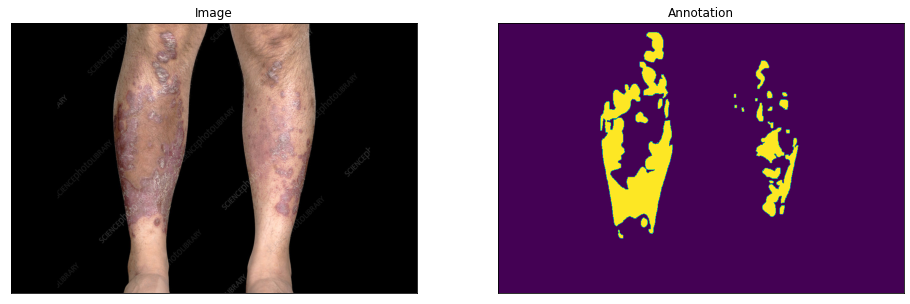

19


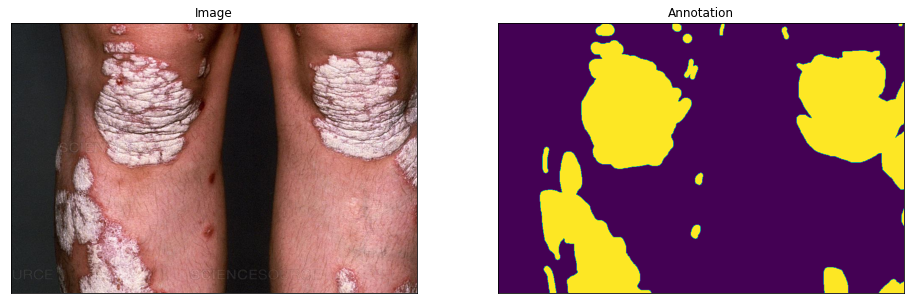

20


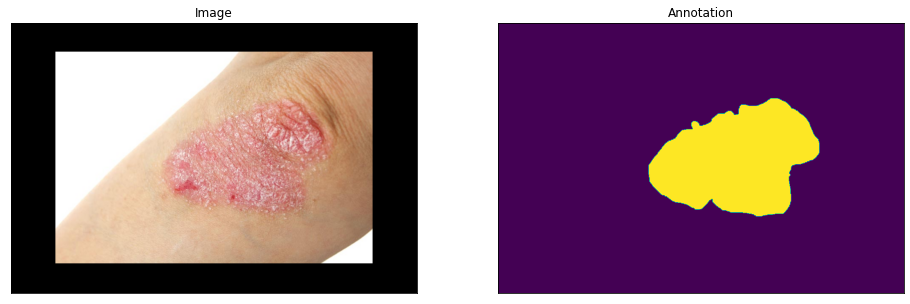

21


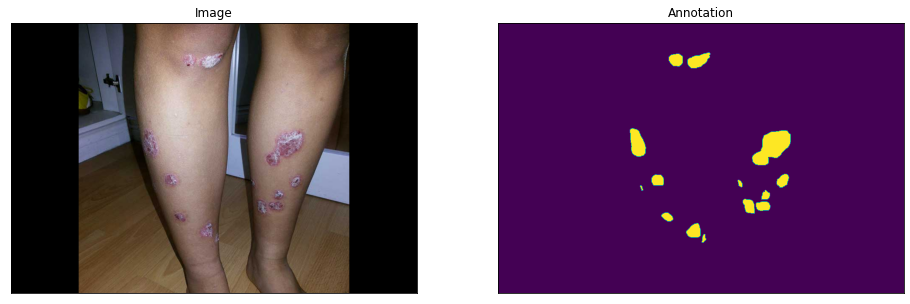

22


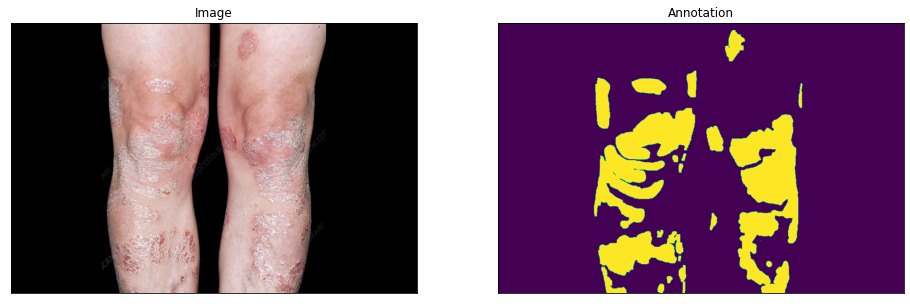

23


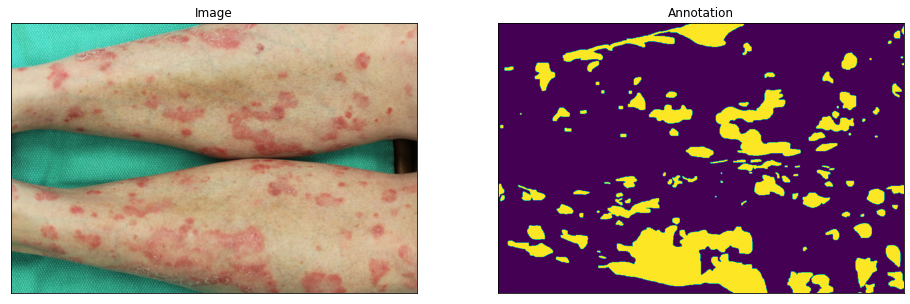

24


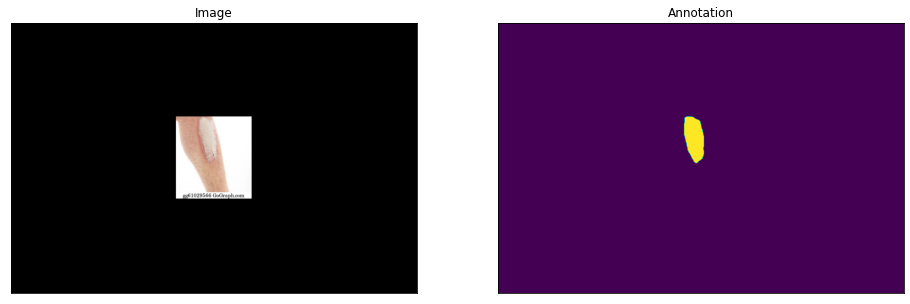

25


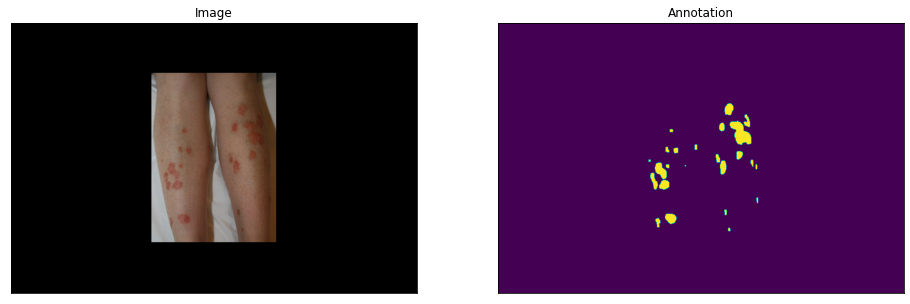

26


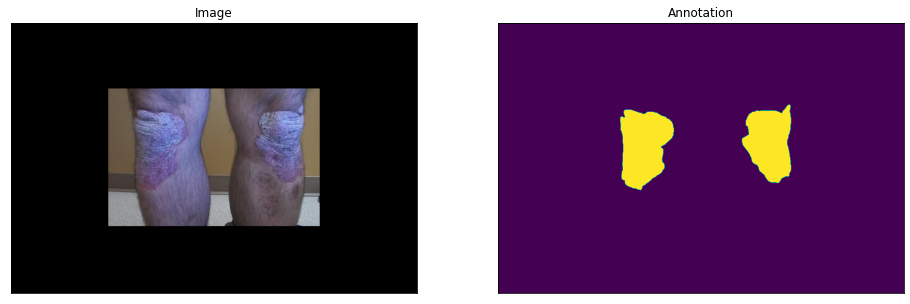

27


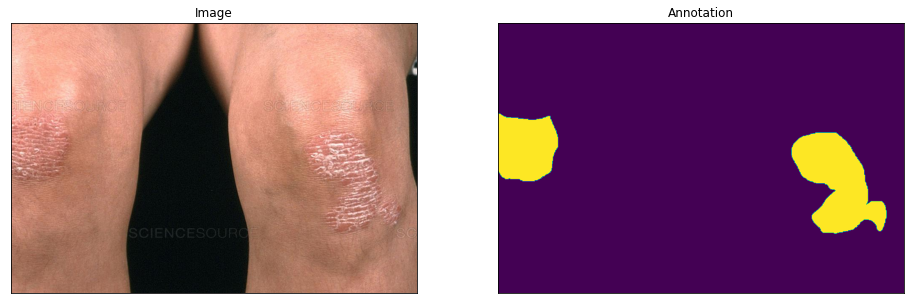

28


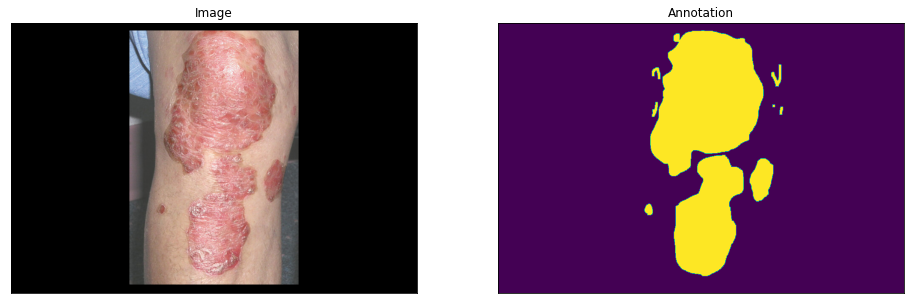

29


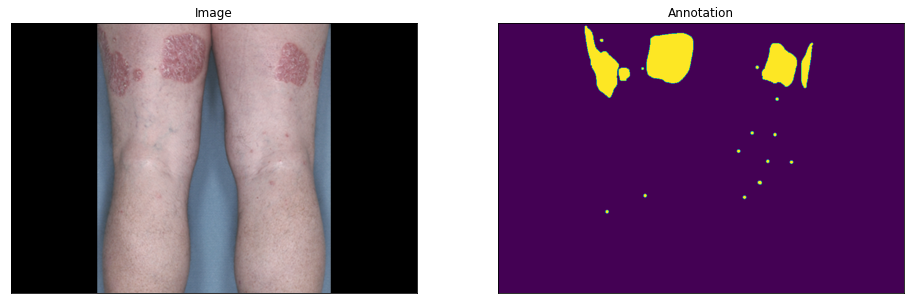

30


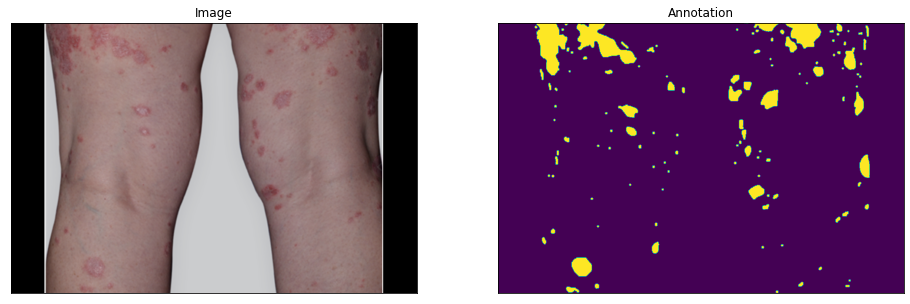

31


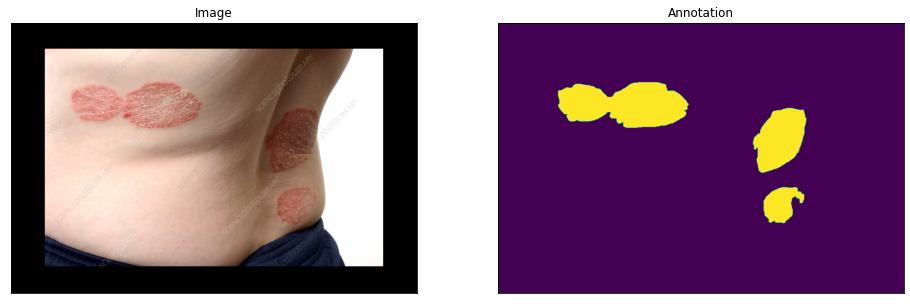

32


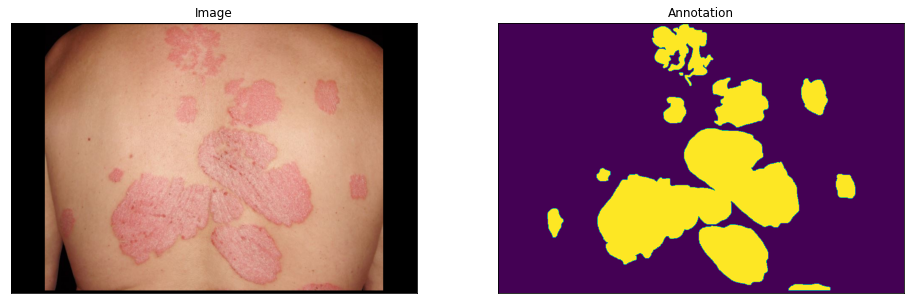

33


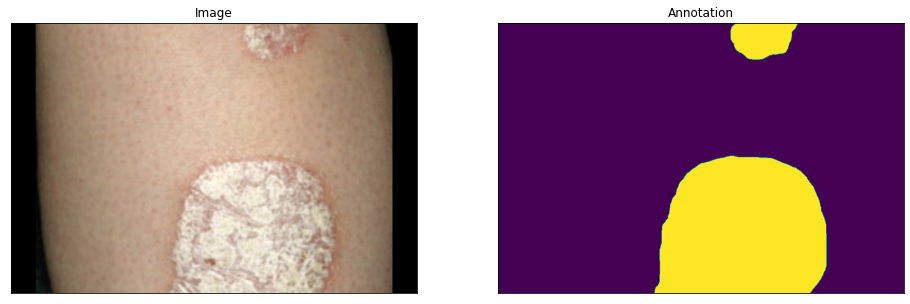

34


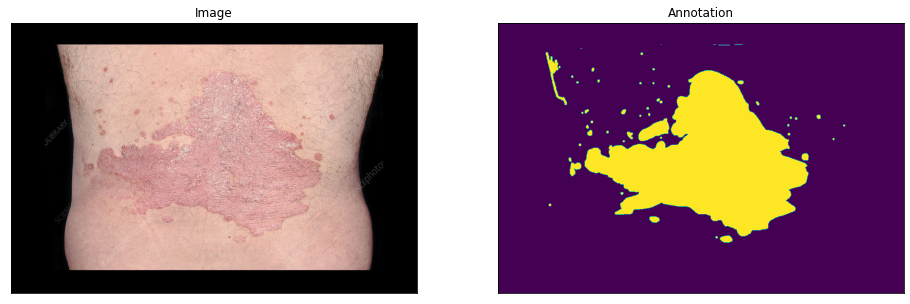

35


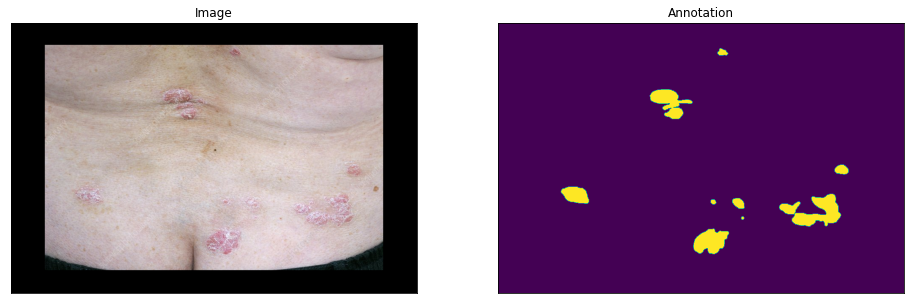

36


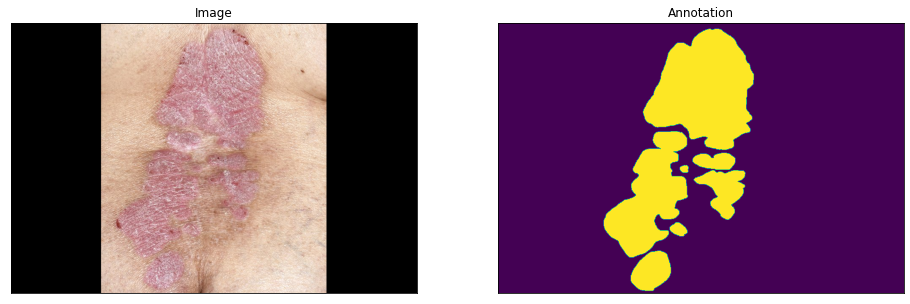

37


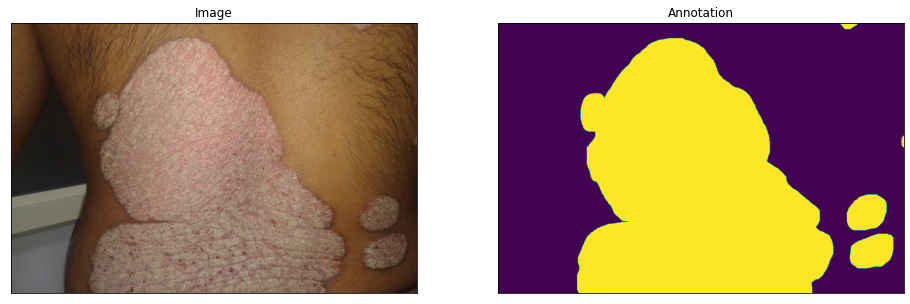

38


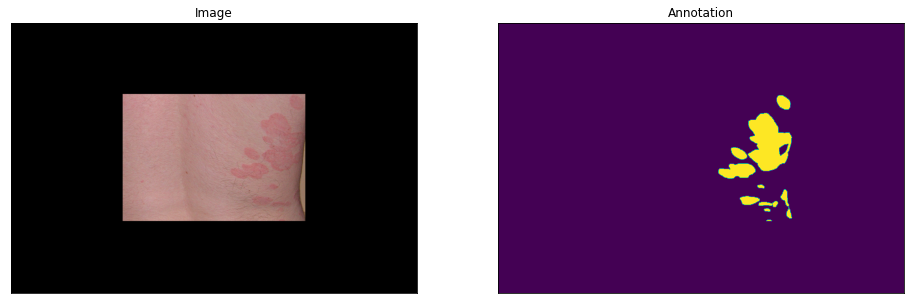

39


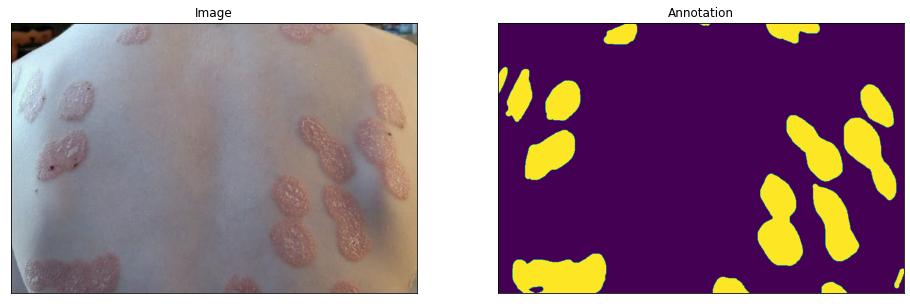

40


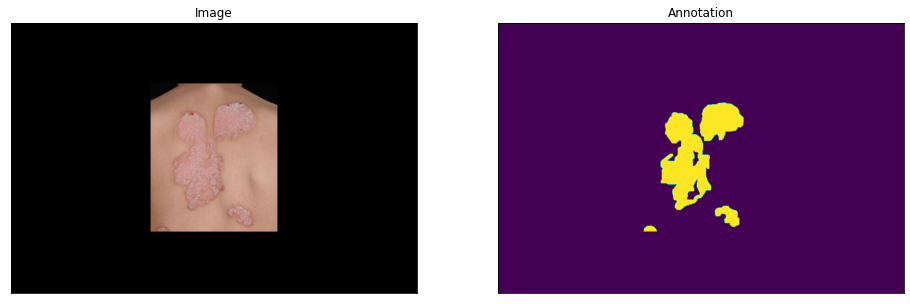

41


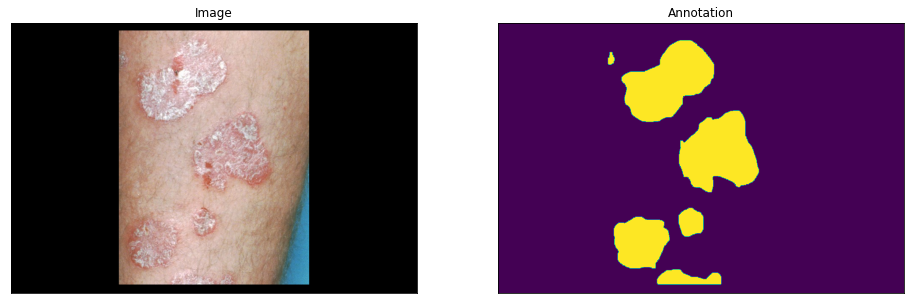

42


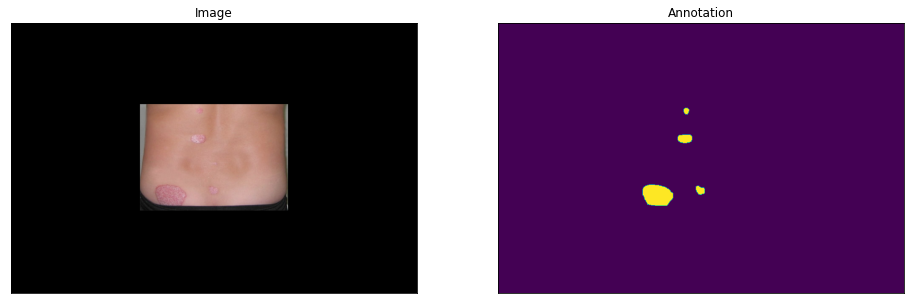

43


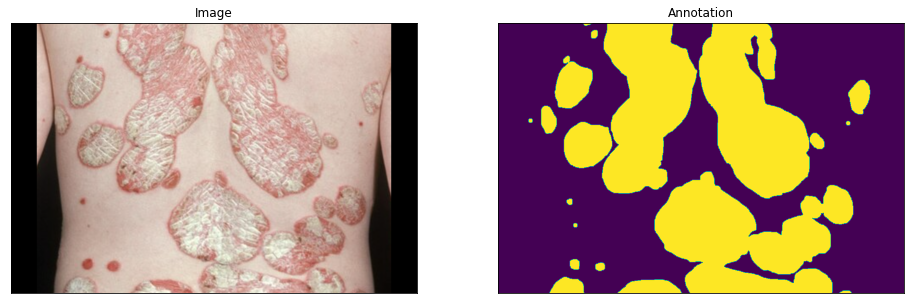

44


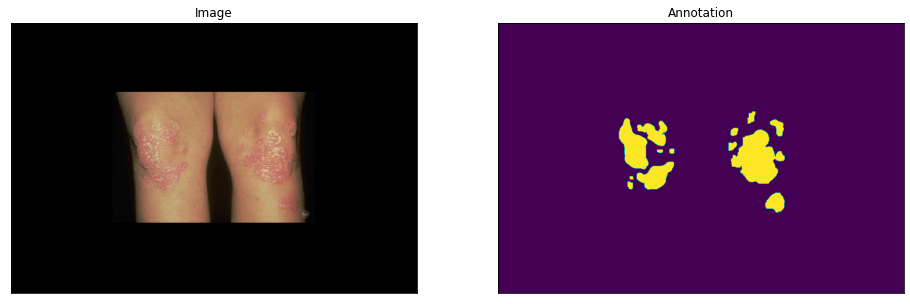

45


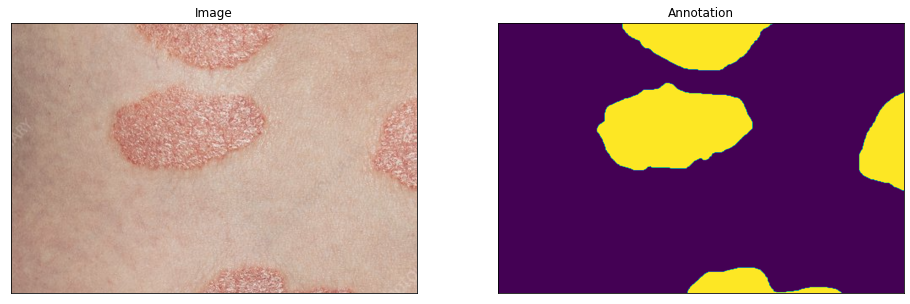

46


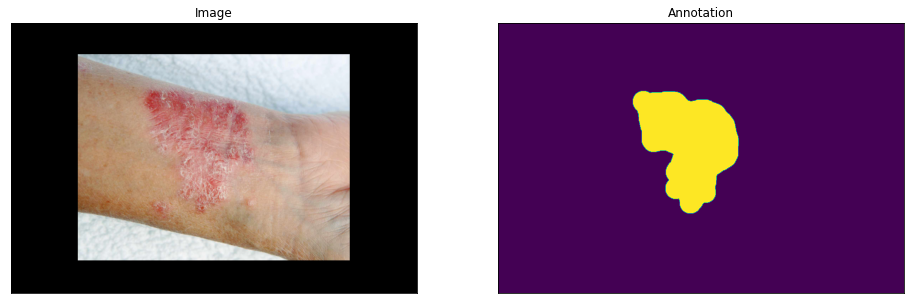

47


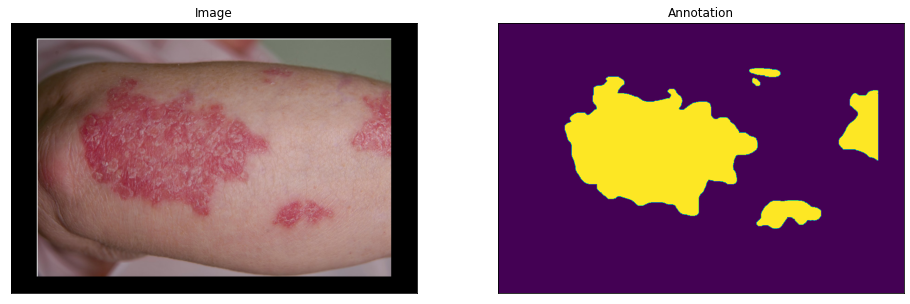

48


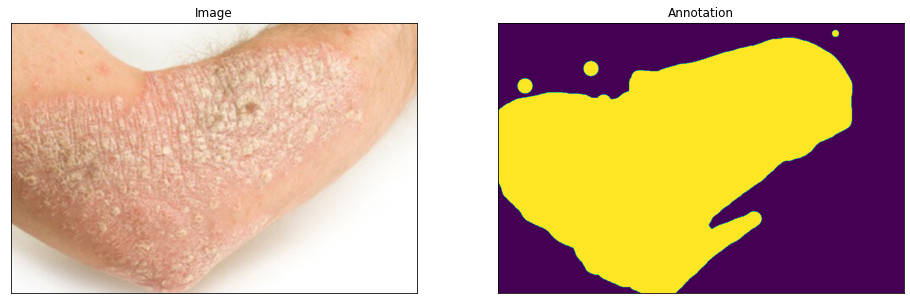

49


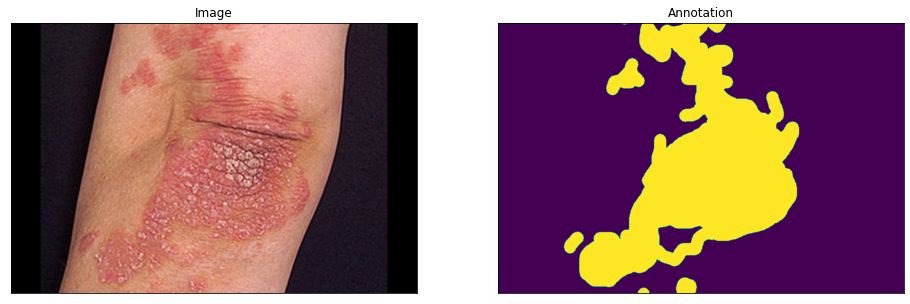

50


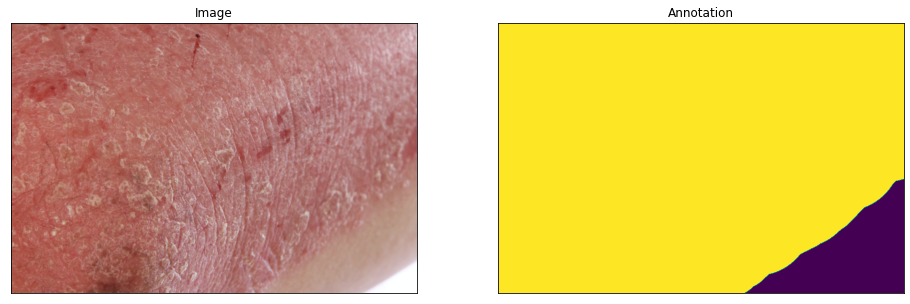

51


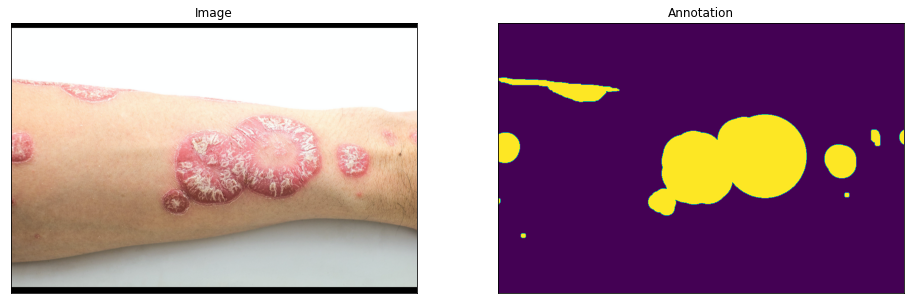

52


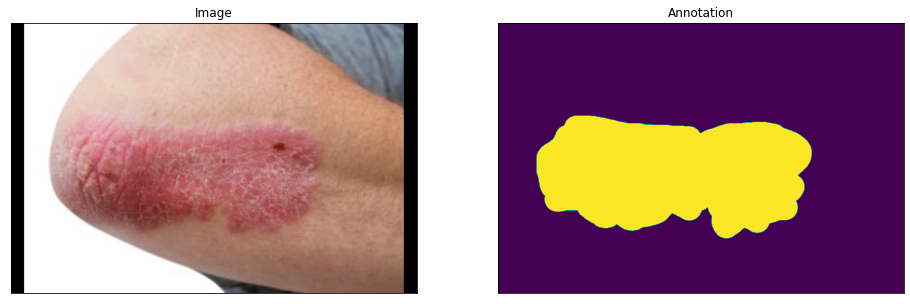

53


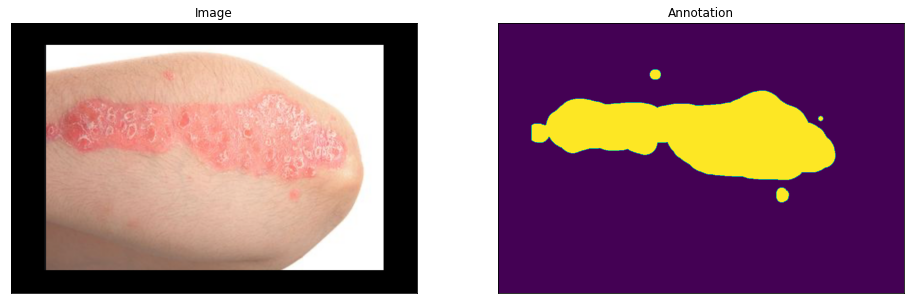

54


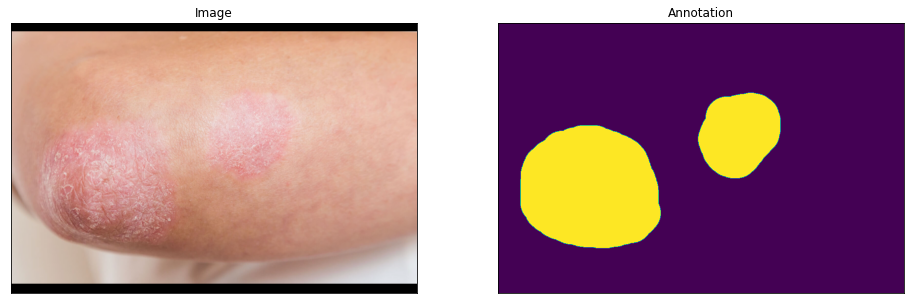

55


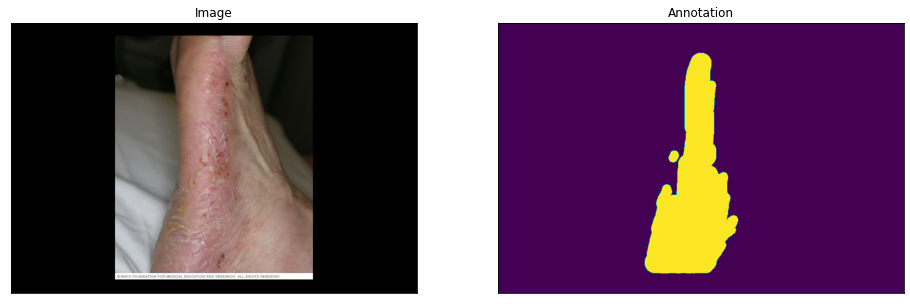

56


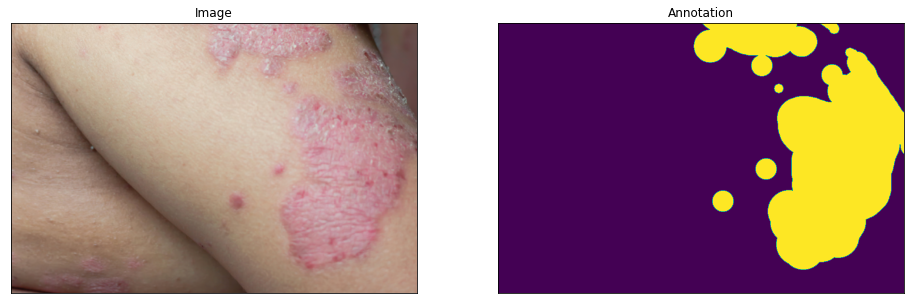

57


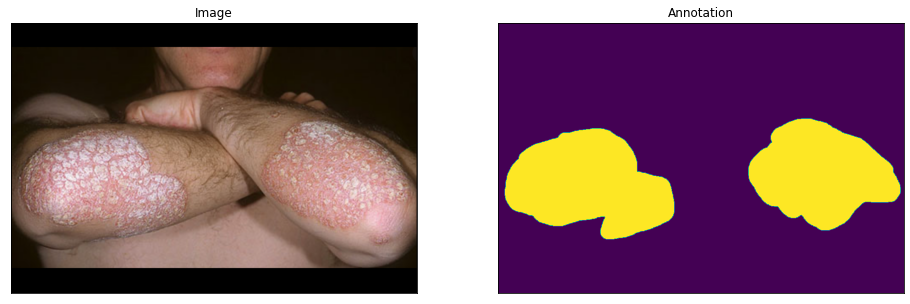

58


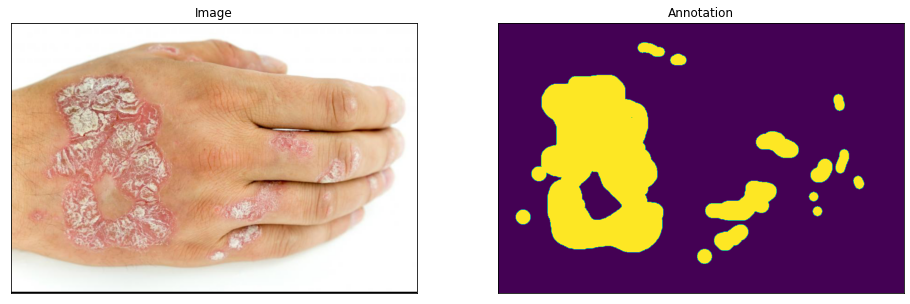

59


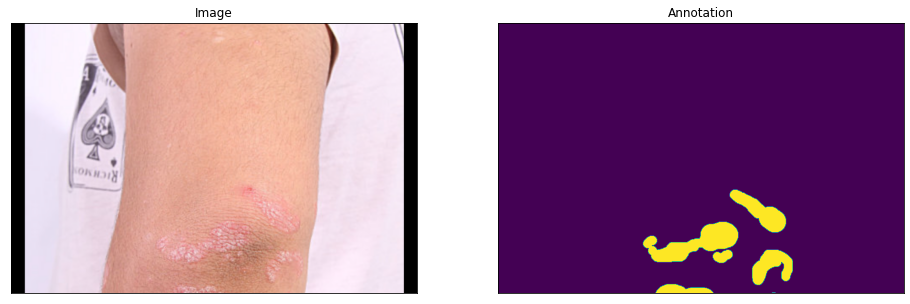

60


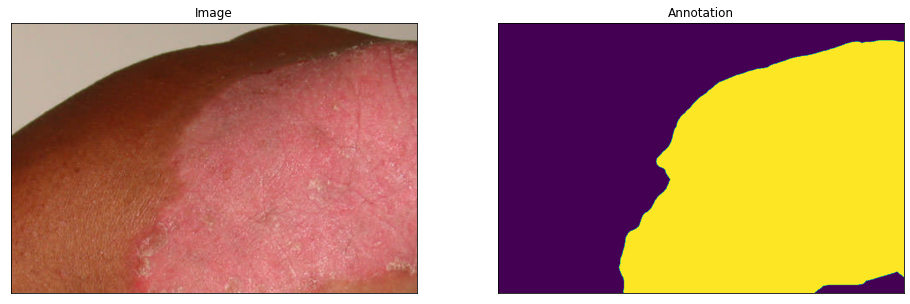

61


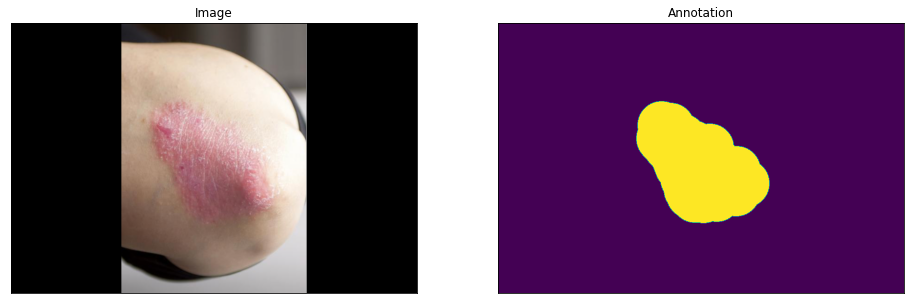

62


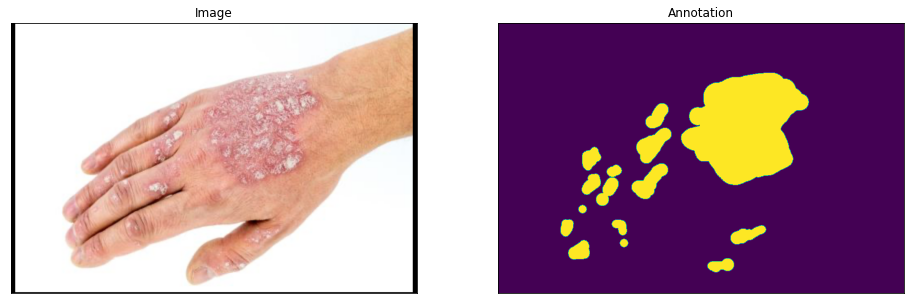

63


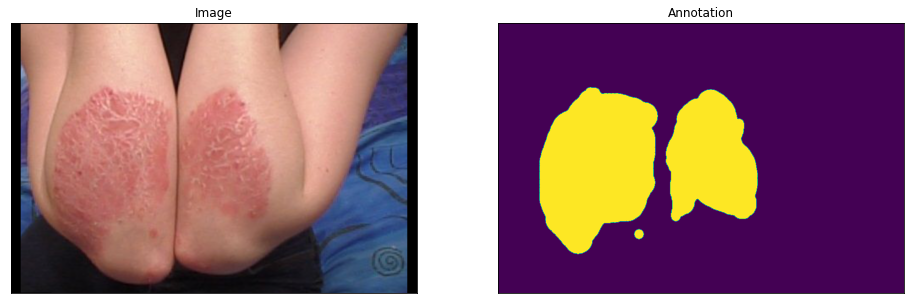

64


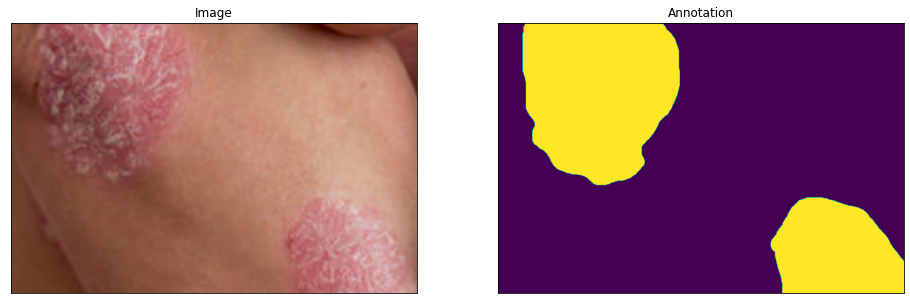

65


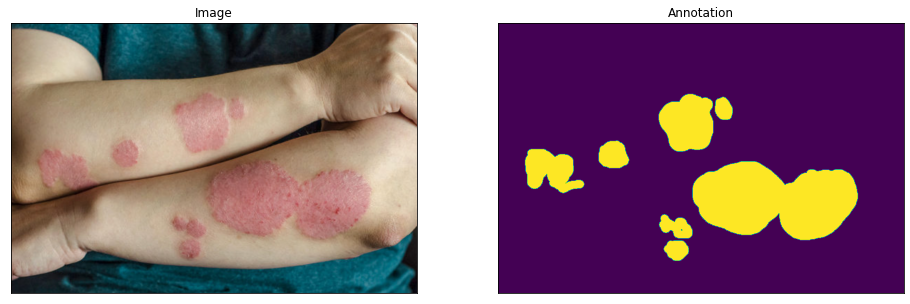

66


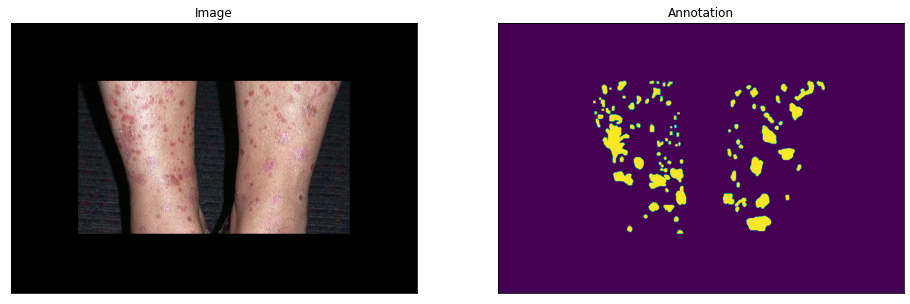

67


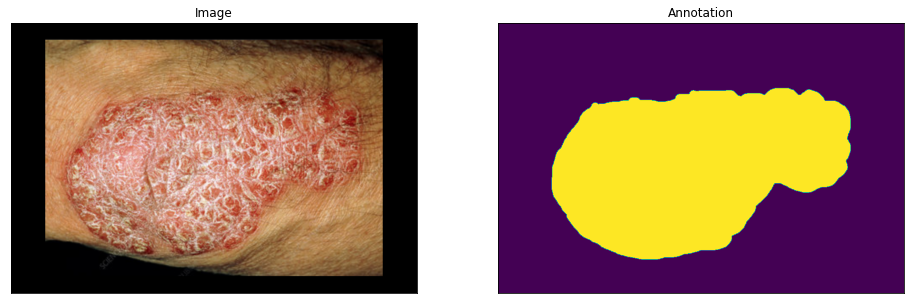

68


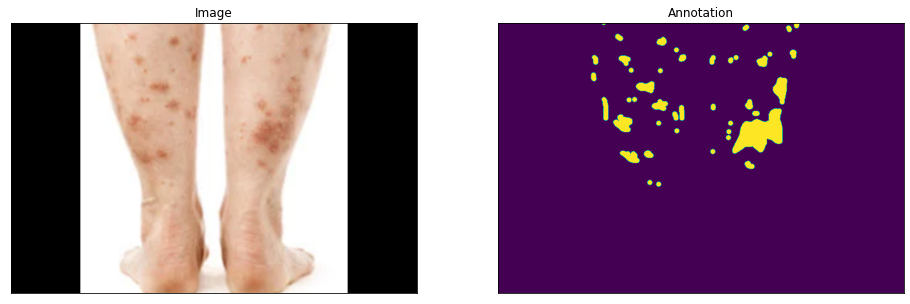

69


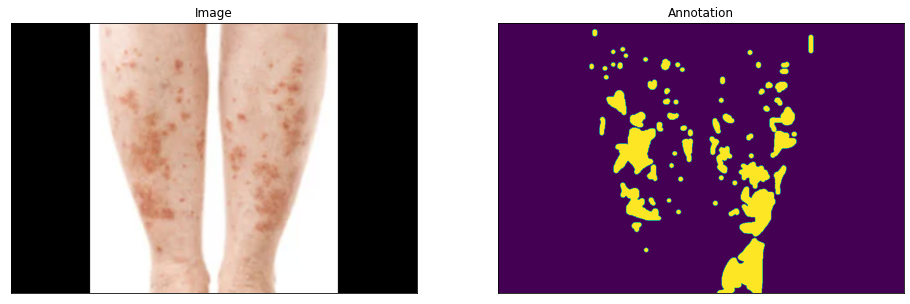

In [147]:
#  Visualize resulted augmented images and annotations
augmentedDataset = Dataset(
    xTrainDir,
    psoriasisTrainDir,
    augmentation = getTrainingAugmentation(),
    classes=['body'],
)

# same image with different random transforms
for i in range(70):
  print(i)
  image, annotation = augmentedDataset[i]
  
  visualize(image=image, annotation =annotation.squeeze(-1))


In [142]:
# Import required package for create and train model
import torch
import numpy as np
import segmentation_models_pytorch as smp



In [143]:
#encoderName=['resnet18','resnet34','resnet50','resnet101','resnet152']
#encoderName= ['timm-resnest14d','timm-resnest26d','timm-resnest50d','timm-resnest101e','timm-resnest200e','timm-resnest269e','timm-resnest50d_4s2x40d','timm-resnest50d_1s4x24d']
encoderName = ['timm-regnetx_080']#,'resnext101_32x48d']

for j in encoderName:
  print('Start Training....')
  ic(j)
  # create model
  ENCODER = j # Default "se_resnext50_32x4d"
  ENCODER_WEIGHTS = 'imagenet'
  CLASSES = ['body']
  ACTIVATION = 'sigmoid' # could be None for logits or 'softmax2d' for multicalss segmentation
  # DEVICE = 'cuda'
  aux_params=dict(
    pooling='avg',             # one of 'avg', 'max'
    dropout=0,               # dropout ratio, default is None
    activation='sigmoid',      # activation function, default is None
    classes=len(CLASSES),                 # define number of output labels
  )

  # create segmentation model with pretrained encoder
  model = smp.FPN(
      encoder_name=ENCODER, 
      encoder_weights=ENCODER_WEIGHTS, 
      classes=len(CLASSES), 
      activation=ACTIVATION,
#       aux_params=aux_params,
  )

  preprocessingFcn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

    # Data load

  # Load Dataset for Train
  trainDataset = Dataset(
      xTrainDir, 
      psoriasisTrainDir, 
      augmentation=getTrainingAugmentation(), 
      preprocessing=getPreprocessing(preprocessingFcn),
      classes=CLASSES,
  )

  # Load Dataset for Valid
  validDataset = Dataset(
      xValidDir, 
      psoriasisValidDir, 
      augmentation=getTrainingAugmentation(), 
      preprocessing=getPreprocessing(preprocessingFcn),
      classes=CLASSES,
  )

  trainLoader = DataLoader(trainDataset, batch_size=5, shuffle=True, num_workers=0)
  validLoader = DataLoader(validDataset, batch_size=1, shuffle=False, num_workers=0)

  # Set train parameters
  loss = smp.utils.losses.DiceLoss()

  metrics = [
            smp.utils.metrics.IoU(threshold=0.5),
            smp.utils.metrics.Fscore(threshold=0.5),
            smp.utils.metrics.Accuracy(threshold=0.5),
            smp.utils.metrics.Recall(threshold=0.5),
            smp.utils.metrics.Precision(threshold=0.5),
  ]

  optimizer = torch.optim.Adam([
                                dict(params = model.parameters(), lr =0.001),
  ])

    # create epoch runners 
  # it is a simple loop of iterating over dataloader`s samples
  train_epoch = smp.utils.train.TrainEpoch(
      model,
      loss=loss,
      metrics=metrics,
      optimizer=optimizer,
      verbose=True,
  )

  valid_epoch =smp.utils.train.ValidEpoch(
      model,loss=loss,
      metrics=metrics,
      verbose=True,
  )

  # train model for 50 epochs

  max_score =0
    
  for i in range(0,50):
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(trainLoader)
    valid_logs = valid_epoch.run(validLoader)
    
    # do something (save model, change lr, etc.)
    if max_score < valid_logs['iou_score']:
      max_score = valid_logs['iou_score']
      torch.save(model,'./best_model_for_Plaque.pth')
      print('Model saved!')
      ic(ENCODER)

    if i ==20:
      optimizer.param_groups[0]['lr'] = 1e-4
      print('Decrease decoder learning rate to 1e-4!')
    
    if i ==40:
      optimizer.param_groups[0]['lr'] = 1e-5
      print('Decrease decoder learning rate to 1e-5!')
    
  print('Complete Training....')
  ic(j)
    


ic| j: 'timm-regnetx_080'


Start Training....

Epoch: 0
train: 100%|█| 14/14 [07:25<00:00, 31.81s/it, dice_loss - 0.3975, iou_score - 0.4682, fscore - 0.6058, accuracy - 0.826
valid: 100%|█| 15/15 [01:19<00:00,  5.29s/it, dice_loss - 0.3682, iou_score - 0.5046, fscore - 0.6444, accuracy - 0.811
Model saved!


ic| ENCODER: 'timm-regnetx_080'



Epoch: 1
train: 100%|█| 14/14 [07:52<00:00, 33.77s/it, dice_loss - 0.2834, iou_score - 0.5867, fscore - 0.7179, accuracy - 0.900
valid: 100%|█| 15/15 [01:21<00:00,  5.41s/it, dice_loss - 0.2794, iou_score - 0.5915, fscore - 0.7242, accuracy - 0.837
Model saved!


ic| ENCODER: 'timm-regnetx_080'



Epoch: 2
train: 100%|█| 14/14 [07:44<00:00, 33.19s/it, dice_loss - 0.2459, iou_score - 0.6176, fscore - 0.7549, accuracy - 0.924
valid: 100%|█| 15/15 [01:17<00:00,  5.19s/it, dice_loss - 0.3822, iou_score - 0.4762, fscore - 0.6196, accuracy - 0.790

Epoch: 3
train: 100%|█| 14/14 [07:41<00:00, 32.95s/it, dice_loss - 0.2078, iou_score - 0.668, fscore - 0.7939, accuracy - 0.9425
valid: 100%|█| 15/15 [01:19<00:00,  5.27s/it, dice_loss - 0.3725, iou_score - 0.5068, fscore - 0.6282, accuracy - 0.845

Epoch: 4
train: 100%|█| 14/14 [07:30<00:00, 32.17s/it, dice_loss - 0.1969, iou_score - 0.6846, fscore - 0.8065, accuracy - 0.939
valid: 100%|█| 15/15 [01:16<00:00,  5.11s/it, dice_loss - 0.3958, iou_score - 0.4567, fscore - 0.6039, accuracy - 0.811

Epoch: 5
train: 100%|█| 14/14 [07:18<00:00, 31.30s/it, dice_loss - 0.1778, iou_score - 0.7085, fscore - 0.8245, accuracy - 0.944
valid: 100%|█| 15/15 [01:14<00:00,  4.98s/it, dice_loss - 0.2719, iou_score - 0.5936, fscore - 0.7291, accuracy - 0.866


ic| ENCODER: 'timm-regnetx_080'


Model saved!

Epoch: 6
train: 100%|█| 14/14 [07:16<00:00, 31.21s/it, dice_loss - 0.1853, iou_score - 0.7, fscore - 0.8163, accuracy - 0.9465, 
valid: 100%|█| 15/15 [01:14<00:00,  4.99s/it, dice_loss - 0.1951, iou_score - 0.6888, fscore - 0.8055, accuracy - 0.862
Model saved!


ic| ENCODER: 'timm-regnetx_080'



Epoch: 7
train: 100%|█| 14/14 [07:19<00:00, 31.36s/it, dice_loss - 0.2089, iou_score - 0.6744, fscore - 0.7924, accuracy - 0.941
valid: 100%|█| 15/15 [01:20<00:00,  5.34s/it, dice_loss - 0.4002, iou_score - 0.5066, fscore - 0.5996, accuracy - 0.839

Epoch: 8
train: 100%|█| 14/14 [07:27<00:00, 32.00s/it, dice_loss - 0.1955, iou_score - 0.6932, fscore - 0.8061, accuracy - 0.940
valid: 100%|█| 15/15 [01:17<00:00,  5.18s/it, dice_loss - 0.329, iou_score - 0.5246, fscore - 0.6708, accuracy - 0.8499

Epoch: 9
train: 100%|█| 14/14 [07:27<00:00, 31.95s/it, dice_loss - 0.135, iou_score - 0.7682, fscore - 0.8675, accuracy - 0.9633
valid: 100%|█| 15/15 [01:17<00:00,  5.15s/it, dice_loss - 0.3136, iou_score - 0.567, fscore - 0.6868, accuracy - 0.8491

Epoch: 10
train: 100%|█| 14/14 [07:26<00:00, 31.91s/it, dice_loss - 0.1142, iou_score - 0.7989, fscore - 0.8876, accuracy - 0.966
valid: 100%|█| 15/15 [01:18<00:00,  5.23s/it, dice_loss - 0.3962, iou_score - 0.4926, fscore - 0.6009, accuracy - 0.847

train: 100%|█| 14/14 [07:39<00:00, 32.83s/it, dice_loss - 0.078, iou_score - 0.8598, fscore - 0.9233, accuracy - 0.9763
valid: 100%|█| 15/15 [01:17<00:00,  5.15s/it, dice_loss - 0.2704, iou_score - 0.6289, fscore - 0.7303, accuracy - 0.876

Epoch: 40
train: 100%|█| 14/14 [07:43<00:00, 33.09s/it, dice_loss - 0.07961, iou_score - 0.8563, fscore - 0.9217, accuracy - 0.97
valid: 100%|█| 15/15 [01:23<00:00,  5.60s/it, dice_loss - 0.2951, iou_score - 0.5818, fscore - 0.7049, accuracy - 0.862
Decrease decoder learning rate to 1e-5!

Epoch: 41
train: 100%|█| 14/14 [07:42<00:00, 33.06s/it, dice_loss - 0.08551, iou_score - 0.8462, fscore - 0.9157, accuracy - 0.97
valid: 100%|█| 15/15 [01:18<00:00,  5.22s/it, dice_loss - 0.2011, iou_score - 0.6949, fscore - 0.7995, accuracy - 0.905
Model saved!


ic| ENCODER: 'timm-regnetx_080'



Epoch: 42
train: 100%|█| 14/14 [07:43<00:00, 33.11s/it, dice_loss - 0.09539, iou_score - 0.8396, fscore - 0.9057, accuracy - 0.97
valid: 100%|█| 15/15 [01:20<00:00,  5.38s/it, dice_loss - 0.2449, iou_score - 0.6347, fscore - 0.7557, accuracy - 0.862

Epoch: 43
train: 100%|█| 14/14 [07:43<00:00, 33.12s/it, dice_loss - 0.08283, iou_score - 0.8503, fscore - 0.9183, accuracy - 0.97
valid: 100%|█| 15/15 [01:18<00:00,  5.26s/it, dice_loss - 0.2992, iou_score - 0.5783, fscore - 0.701, accuracy - 0.8537

Epoch: 44
train: 100%|█| 14/14 [07:42<00:00, 33.04s/it, dice_loss - 0.0701, iou_score - 0.8721, fscore - 0.9309, accuracy - 0.977
valid: 100%|█| 15/15 [01:21<00:00,  5.45s/it, dice_loss - 0.2372, iou_score - 0.6479, fscore - 0.7636, accuracy - 0.873

Epoch: 45
train: 100%|█| 14/14 [07:46<00:00, 33.30s/it, dice_loss - 0.07107, iou_score - 0.8703, fscore - 0.9299, accuracy - 0.98
valid: 100%|█| 15/15 [01:20<00:00,  5.38s/it, dice_loss - 0.2907, iou_score - 0.6022, fscore - 0.7094, accuracy - 0.

ic| j: 'timm-regnetx_080'



Complete Training....


In [154]:
bestModel = torch.load('./best_model_for_Plaque.pth')

In [155]:

# create test dataset

testDataset = Dataset(
    xTestDir, 
    psoriasisTestDir, 
    augmentation=getTrainingAugmentation(), 
    preprocessing=getPreprocessing(preprocessingFcn),
    classes=CLASSES,
)

testDataloader = DataLoader(testDataset)

In [156]:
# evaluate model on test set
test_epoch = smp.utils.train.ValidEpoch(
    model=bestModel,
    loss=loss,
    metrics=metrics,
#     device=DEVICE,
)

logs = test_epoch.run(testDataloader)

valid: 100%|█| 15/15 [01:21<00:00,  5.40s/it, dice_loss - 0.2728, iou_score - 0.6148, fscore - 0.7272, accuracy - 0.869


In [157]:
# test dataset without transformations for image visualization
testDatasetVis = Dataset(
    xTestDir, psoriasisTestDir,  
    augmentation=getTrainingAugmentation(), 
#     preprocessing=getPreprocessing(preprocessingFcn),
    classes=CLASSES,
)

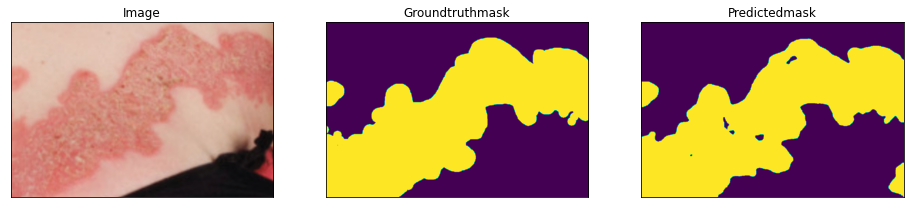

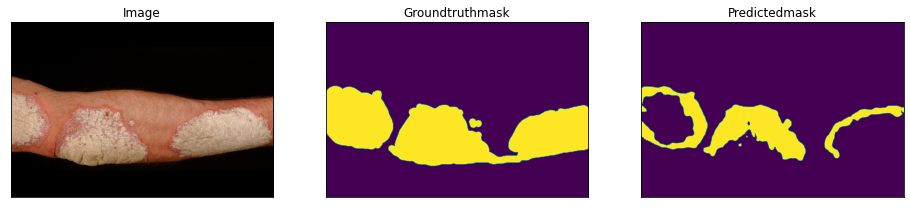

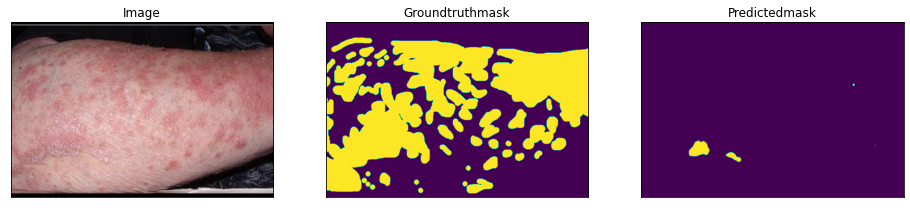

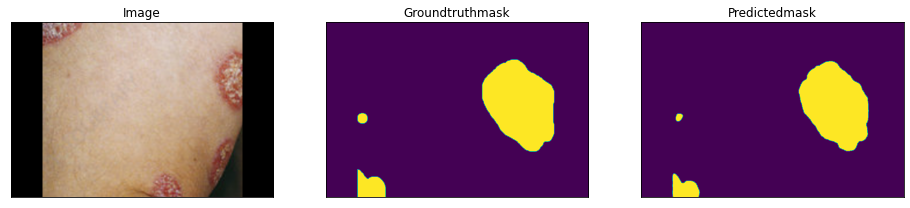

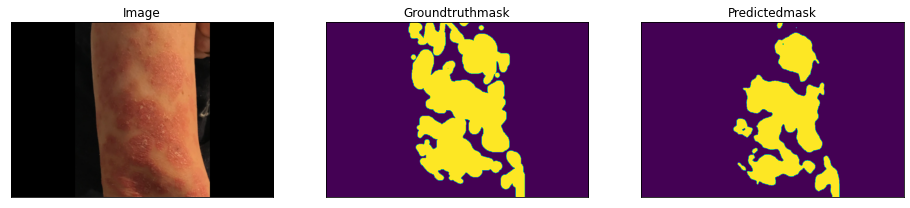

...

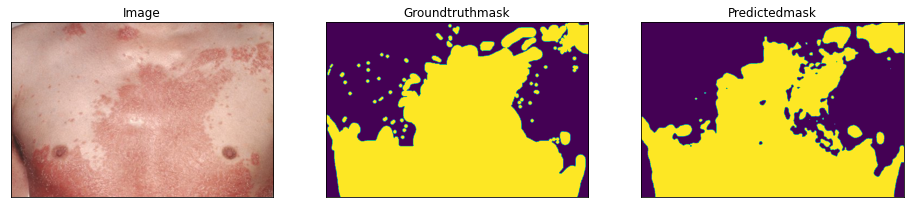

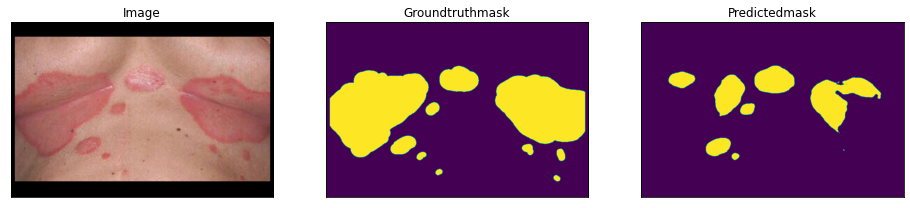

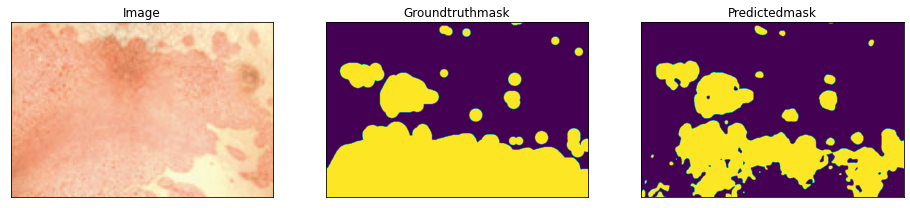

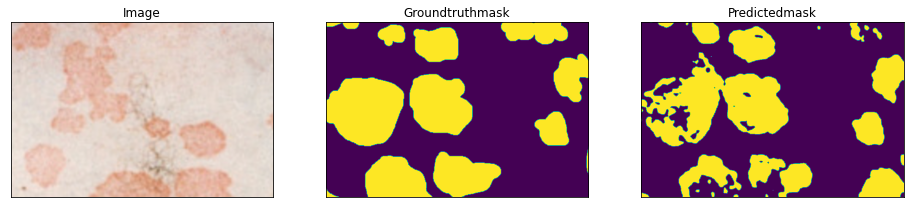

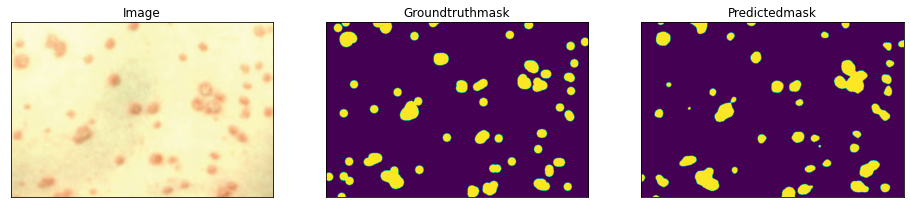

In [158]:
for i in range(15):
#     n = np.random.choice(len(testDataset))
    n=i
    imageVis = testDatasetVis[n][0]#.astype('uint8')
    image, gtMask = testDataset[n]
    
    gtMask = gtMask.squeeze()
    
    xTensor = torch.from_numpy(image).unsqueeze(0)
    prMask = bestModel.predict(xTensor)
    prMask = (prMask.squeeze().cpu().numpy().round())
        
    visualize(
        image=imageVis, 
        groundTruthMask=gtMask, 
        predictedMask=prMask
    )